<a href="https://colab.research.google.com/github/yxmauw/eye-disease-classification/blob/main/model_notebooks/InceptionResNetV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="http://imgur.com/1ZcRyrc.png" width="70" height="70" align="left" style="margin: 20px"> 
 # Capstone: Eye Disease Classification using Fundoscopy images

## Problem Statement

_Fictional scenario_

> Singapore Health Promotion Board is searching for innovative, cutting-edge technological solutions to facilitate mass eye screening of common eye diseases in the general adult population. They hope to automate interpretation of retina screening images, shorten the time taken to flag high-risk persons for further health assessment. This would allow early intervention, lower risk of disease progression and lower overall healthcare cost burden. By minimising number of people in the population with severe eye disease, we minimise the use of more costly therapies.  

> Using 4,217 retinal images collected from various sources like IDRiD, Oculur recognition, HRF etc, construct a machine learning algorithm to help classify a RGB retina image to any of 4 classes (cataract, diabetic retinopathy, glaucoma and normal).

_**Potential stakeholders:** public health authorities, eye clinics, neighbourhood eye screening centres e.g. optical shops_

## Setting up local directory to work
Stream data direct from kaggle using Kaggle API

In [ ]:
# install kaggle API if never done before for your google account
# !pip install kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!git clone https://github.com/yxmauw/eye-disease-classification.git

Cloning into 'eye-disease-classification'...
remote: Enumerating objects: 375, done.
remote: Counting objects: 100% (241/241), done.
remote: Compressing objects: 100% (168/168), done.
remote: Total 375 (delta 137), reused 129 (delta 73), pack-reused 134
Receiving objects: 100% (375/375), 65.64 MiB | 22.61 MiB/s, done.
Resolving deltas: 100% (214/214), done.


In [ ]:
!mkdir ~/.kaggle #Make a directory named “.kaggle”

In [ ]:
!cp ./eye-disease-classification/kaggle.json ~/.kaggle/ # Copy the “kaggle.json” into this new directory

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json # Allocate the required permission for this file

In [ ]:
!kaggle datasets download gunavenkatdoddi/eye-diseases-classification # download dataset

 98% 721M/736M [00:06<00:00, 176MB/s]
100% 736M/736M [00:07<00:00, 108MB/s]


In [ ]:
!unzip eye-diseases-classification.zip

## Data

| Eye disease          | No. of images |
|:---------------------|:-------------:|
| Cataract             |     1038      |
| Diabetic retinopathy |     1098      |
| Glaucoma             |     1007      |
| Normal               |     1074      |
| ***                  | ***           |
| **Total**            |   **4217**    |

## Explore images

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
sns.set_style('whitegrid')
%config InlineBackend.figure_format = 'retina'

### Number of images in dataset:

In [ ]:
import fnmatch
import os

In [ ]:
# image files count
cataract_count = len(fnmatch.filter(os.listdir('./dataset/cataract'), '*.*'))
dre_count = len(fnmatch.filter(os.listdir('./dataset/diabetic_retinopathy'), '*.*'))
glaucoma_count = len(fnmatch.filter(os.listdir('./dataset/glaucoma'), '*.*'))
normal_count = len(fnmatch.filter(os.listdir('./dataset/normal'), '*.*'))
total_image_count = cataract_count + dre_count + \
                    glaucoma_count + normal_count
# print count
print('---Categories---')
print('Cataract:', cataract_count)
print('Diabetic retinopathy:', dre_count)
print('Glaucoma:', glaucoma_count)
print('Normal', normal_count)
print()
print('---Total image count---')
print(total_image_count)

---Categories---
Cataract: 1038
Diabetic retinopathy: 1098
Glaucoma: 1007
Normal 1074

---Total image count---
4217


### Image dimensions, properties:

In [ ]:
from PIL import Image 

In [ ]:
# load example image
im = Image.open('./dataset/glaucoma/1495_left.jpg')
# summarize some details about the image
print(im.format)
print(im.mode)
print(im.size) # size already 512 x 512

pixels = np.asarray(im)
print(pixels[0])
print(pixels.shape) # 3 channel last

JPEG
RGB
(512, 512)
[[0 0 0]
 [0 0 0]
 [0 0 0]
 ...
 [0 0 0]
 [0 0 0]
 [0 0 0]]
(512, 512, 3)


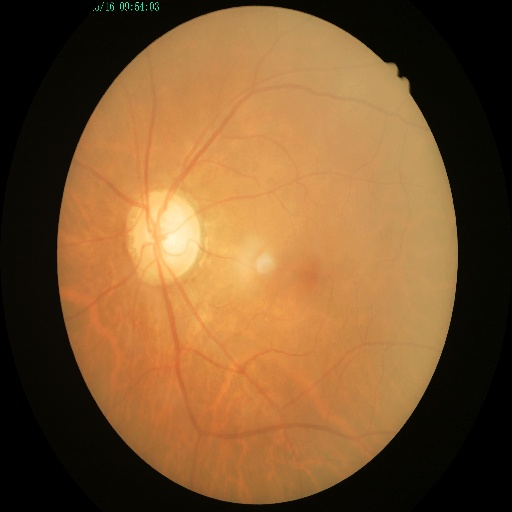

In [ ]:
#Import library
from IPython import display
display.Image(filename='./dataset/glaucoma/1495_left.jpg', width=200, height=150)

In [ ]:
# calculate image pixel mean, min, max

mean = pixels.mean()
print('Mean: %.3f' % mean)
# confirm pixel range is 0-255
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))

Mean: 86.173
Min: 0.000, Max: 255.000


## Image hashing

To identify any duplicate images

__References:__
1. [StackOverflow](https://stackoverflow.com/questions/64994057/python-image-hashing)
1. [Hashlib documentation](https://docs.python.org/3/library/hashlib.html)
1. [Blake2b hashing algorithm](https://research.kudelskisecurity.com/2017/03/06/why-replace-sha-1-with-blake2/)

In [ ]:
import hashlib
import glob

In [ ]:
def img_hash(images, dir): # dir is string of subdirectory
    # https://stackoverflow.com/questions/22058048/hashing-a-file-in-python
    hash_list = [] # list of tuples (filename, hash)
    for image in images:
      with open(image, "rb") as f:
          hash = hashlib.blake2b(f.read()).hexdigest() # extract hash code
          filename = os.path.basename(image) # extract subdirectory and filename
          dir_filename = os.path.join(dir, filename)
          hash_list.append((dir_filename, hash)) 
          hash_df = pd.DataFrame(hash_list, columns=['filename','hash']) # dataframe of filenames & hashes
    return hash_df

In [ ]:
# hash cataract images
cataract_imgs = glob.glob("./dataset/cataract/*.*")
display(img_hash(images = cataract_imgs, dir='cataract')[:3]) # check format
# assign object to list 
cataract_hashdf = img_hash(images = cataract_imgs, dir='cataract')

,filename,hash
0,cataract/2234_left.jpg,5c5591f7845ded6449f8da341efa621af54c470e1788dc...
1,cataract/_56_3359017.jpg,bf05823f54555ede4b7d1317c8d45d155d7cc7764da1ef...
2,cataract/_267_6890587.jpg,da4b0bb89136091f9c9fdddff6d3a4a3c0ea25eb75fd7e...


In [ ]:
# hash diabetic retinopathy images
dre_imgs = glob.glob("./dataset/diabetic_retinopathy/*.*")
dre_hashdf = img_hash(images = dre_imgs, dir='dre')

In [ ]:
# hash glaucoma images
glaucoma_imgs = glob.glob("./dataset/glaucoma/*.*")
glaucoma_hashdf = img_hash(images = glaucoma_imgs, dir='glaucoma')

In [ ]:
# hash normal images
normal_imgs = glob.glob("./dataset/normal/*.*")
normal_hashdf = img_hash(images = normal_imgs, dir='normal')

In [ ]:
# join all the hash dataframes together
hash_df = pd.concat([cataract_hashdf, dre_hashdf, glaucoma_hashdf, normal_hashdf], ignore_index=True)
# check hash_list count # should be 4217
len(hash_df)

4217

#### Search for duplicate hash codes:

In [ ]:
duplicate_hashes = hash_df[hash_df.duplicated('hash', keep=False)] # based on hash codes only
print("Duplicate images based on hashcodes:")
display(duplicate_hashes) # 2 duplicate hashes. 

Duplicate images based on hashcodes:


,filename,hash
166,cataract/625_left.jpg,9b41fcbbbdd4a1429f16d915f026d87f7a94f9a77eb3ef...
171,cataract/1415_right.jpg,a029f6e63fa8919142ac8a4c024caf81db515aa44bf4a7...
2294,glaucoma/625_left.jpg,9b41fcbbbdd4a1429f16d915f026d87f7a94f9a77eb3ef...
2301,glaucoma/1415_right.jpg,a029f6e63fa8919142ac8a4c024caf81db515aa44bf4a7...


2 images in glaucoma dataset are duplicate with 2 images in cataract dataset. Since it is not a significant number of images that are duplicate (2), and I have already run the model previously, I will leave the model as it is, trained with the original 4217 images. 

On closer inspection, both images `625_left.jpg` and `1415_right.jpg` has both cataract and glaucoma present (multiple diseases in one eye). Perhaps that is why the image was duplicated to both classes. 

## Visualise preprocessed images

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
print(tf.__version__) #2.8.2

2.8.2


What happens after resizing and rescaling: 

In [ ]:
resize_and_rescale = tf.keras.Sequential([   
    layers.Resizing(299,299) ,  # needs to be symmetrical, specific size for InceptionResNetV2
    layers.Rescaling(1./255) # desired height, width in model pipeline
])

result = resize_and_rescale(pixels)
print(result.shape) # new shape, channels

(299, 299, 3)


What happens to image pixel values after rescaling:

In [ ]:
print("Min and max pixel values:", result.numpy().min(), result.numpy().max())

Min and max pixel values: 0.0 1.0


Show images before and after preprocessing:

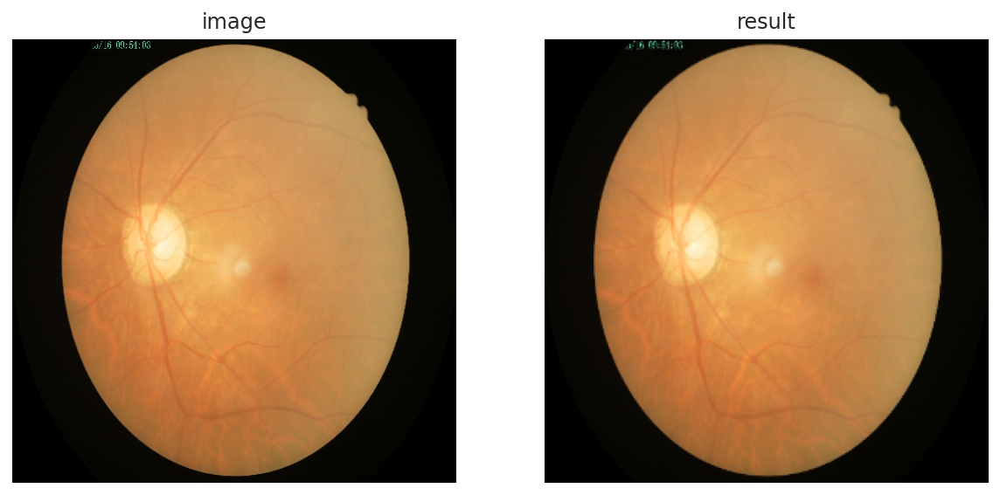

In [ ]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10,8))
ax0.imshow(im)
ax0.axis('off')
ax0.set_title('image')
# after pixel normalisation
ax1.imshow(result)
ax1.axis('off')
ax1.set_title('result')
plt.show() # result seems to have slight blurring of image, but still good definition

## Create train, validation and test datasets

In [ ]:
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# first allocate a test set using this library
import splitfolders

splitfolders.ratio('./dataset/', output="./work_directory/", seed=1, ratio=(.5,.25,.25))

Copying files: 4217 files [00:01, 2756.44 files/s]


In [ ]:
# generate dataset that can be used for machine learning
from tensorflow.keras.utils import image_dataset_from_directory

image_size = (299, 299) # very important to get this right, will determine model success
batch_size = 32

train_ds = image_dataset_from_directory(
    './work_directory/train',
    image_size=image_size,
    shuffle=False,
    labels='inferred',
    seed=1,
    batch_size=batch_size,
    label_mode='categorical'
)

val_ds = image_dataset_from_directory(
    './work_directory/val',
    image_size=image_size,
    shuffle=False,
    labels='inferred',
    seed=1,
    batch_size=batch_size,
    label_mode='categorical'
)

test_ds = image_dataset_from_directory( # for model evaluation later
    './work_directory/test',
    image_size=image_size,
    labels='inferred',
    seed=1,
    shuffle=False,
    batch_size=batch_size,
    label_mode='categorical'
)

Found 2108 files belonging to 4 classes.
Found 1052 files belonging to 4 classes.
Found 1057 files belonging to 4 classes.


In [ ]:
# preview of how images are labelled
class_names = train_ds.class_names
print(class_names)

['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']


### Visualise images and labels together

['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']


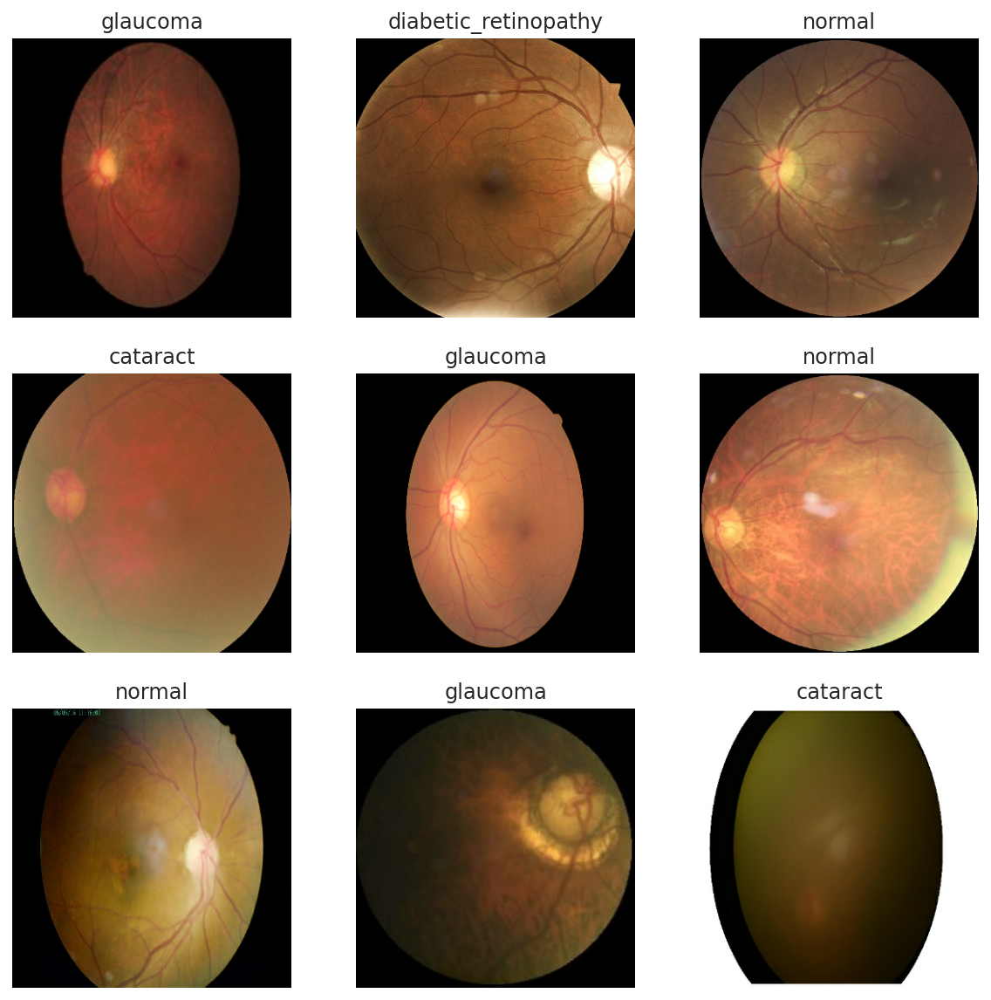

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1): # each image 160 x 160
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[tf.argmax(labels[i], axis=0)])
    plt.axis("off")

## Data augmentation

In [ ]:
data_augmentation = tf.keras.Sequential(
    [ layers.RandomFlip("horizontal"), 
      layers.RandomRotation(0.1),
      layers.RandomContrast(0.1)
    ])

### Visualise augmented images

In [ ]:
def augmented_img():
  for image, _ in train_ds.take(1):  # take a sample image from training set
    plt.figure(figsize=(8, 8))
    first_image = image[0]
    for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
      plt.imshow(augmented_image[0] / 255) # rescale pixel 0 to 1
      plt.axis("off")

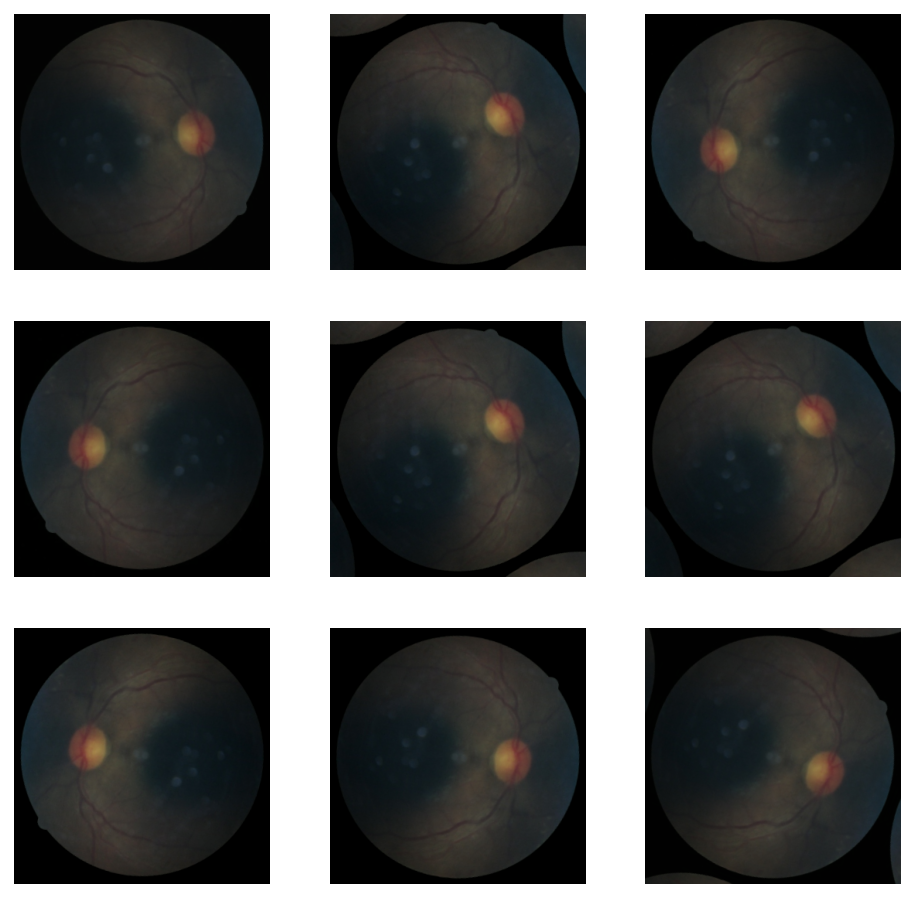

In [ ]:
augmented_img()

## Create Base InceptionResNetV2 model

[getting F1 score in metrics](https://aakashgoel12.medium.com/how-to-add-user-defined-function-get-f1-score-in-keras-metrics-3013f979ce0d)


In [ ]:
import keras.backend as K # function to add F1 score as metric

def f1_score(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [ ]:
METRICS = [
      tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),  
      tf.keras.metrics.AUC(name='auc'),
      f1_score
]

In [ ]:
from tensorflow.keras.layers import (Dense, Activation, Dropout, Conv2D, 
                                     MaxPooling2D, BatchNormalization)
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model

In [ ]:
# Create the base model from the pre-trained NASNetLarge model
def InceptionResNet():
  input_shape = (299, 299, 3)
  base_model = tf.keras.applications.InceptionResNetV2(input_shape=input_shape,
                                                       include_top=False,
                                                       weights='imagenet',
                                                      pooling='max'
                                                       )
  base_model.trainable=True # train entire model layers, yet with pre-trained weights from ImageNet
  x = base_model.output
  x = tf.keras.layers.Rescaling(1./255)(x) # rescaling layer
  x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
  x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
          bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
  x = Dropout(rate=.4, seed=123)(x)       
  output = Dense(4, activation='softmax')(x)
  # instantiate model with added layers
  model=Model(inputs=base_model.input, outputs=output)
  model.compile(tf.keras.optimizers.Adamax(learning_rate=0.001), 
                loss='categorical_crossentropy', 
                metrics=METRICS) 
  return model

model = InceptionResNet()

219070464/219055592 [==============================] - 1s 0us/step


In [ ]:
model.summary()

In [ ]:
# show model in graph manner
tf.keras.utils.plot_model(model, to_file = "drive/MyDrive/Colab Notebooks/InceptionResNetV2.png", show_shapes=True)

## Compile, fit model, run

In [ ]:
# Train the model, doing validation at the end of each epoch.
epochs = 100 

callbacks = [
    tf.keras.callbacks.ModelCheckpoint("drive/MyDrive/Colab Notebooks/IRN_ep{epoch}_val{val_loss:.3f}", save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.001,restore_best_weights=True),
    tf.keras.callbacks.CSVLogger('drive/MyDrive/Colab Notebooks/IRN_history.csv'),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',factor=0.2,patience=3,verbose=1,mode='min',min_lr=0.00001)
]

history = model.fit(train_ds, epochs=epochs, validation_data=val_ds, callbacks=callbacks)

Epoch 1/100
66/66 [==============================] - 531s 8s/step - loss: 4.2476 - categorical_accuracy: 0.8472 - precision: 0.8853 - recall: 0.7908 - auc: 0.9670 - f1_score: 0.8249 - val_loss: 3.0903 - val_categorical_accuracy: 0.8764 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.9624 - val_f1_score: 0.0000e+00 - lr: 0.0010
Epoch 2/100
66/66 [==============================] - 538s 8s/step - loss: 1.5096 - categorical_accuracy: 0.9265 - precision: 0.9382 - recall: 0.9151 - auc: 0.9883 - f1_score: 0.9263 - val_loss: 1.8610 - val_categorical_accuracy: 0.8973 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.9840 - val_f1_score: 0.0000e+00 - lr: 0.0010
Epoch 3/100
66/66 [==============================] - 535s 8s/step - loss: 0.7167 - categorical_accuracy: 0.9635 - precision: 0.9673 - recall: 0.9554 - auc: 0.9962 - f1_score: 0.9612 - val_loss: 1.4329 - val_categorical_accuracy: 0.9049 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.9870

## Learning Curves 

In [ ]:
history = pd.read_csv('drive/MyDrive/Colab Notebooks/IRN_history.csv')
history.head(3)

,epoch,auc,categorical_accuracy,f1_score,loss,precision,recall,val_auc,val_categorical_accuracy,val_f1_score,val_loss,val_precision,val_recall
0,0,0.966999,0.847249,0.824909,4.247622,0.885289,0.790797,0.962446,0.876426,0.0,3.090254,0.0,0.0
1,1,0.988266,0.926471,0.926250,1.509603,0.938230,0.915085,0.983996,0.897338,0.0,1.860973,0.0,0.0
2,2,0.996153,0.963472,0.961155,0.716669,0.967339,0.955408,0.986955,0.904943,0.0,1.432916,0.0,0.0


In [ ]:
acc = history['categorical_accuracy']
val_acc = history['val_categorical_accuracy']

loss = history['loss']
val_loss = history['val_loss']

In [ ]:
def learning_curves(acc,val_acc,loss,val_loss):
  plt.figure(figsize=(8, 8))
  plt.subplot(2, 1, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.ylabel('Accuracy')
  plt.ylim([min(plt.ylim()),max(plt.ylim())])
  plt.xlim([0,max(plt.xlim())])
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 1, 2)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.ylabel('Cross Entropy')
  plt.ylim([min(plt.ylim()),max(plt.ylim())])
  plt.xlim([0,max(plt.xlim())])
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.show()
  return plt.show()

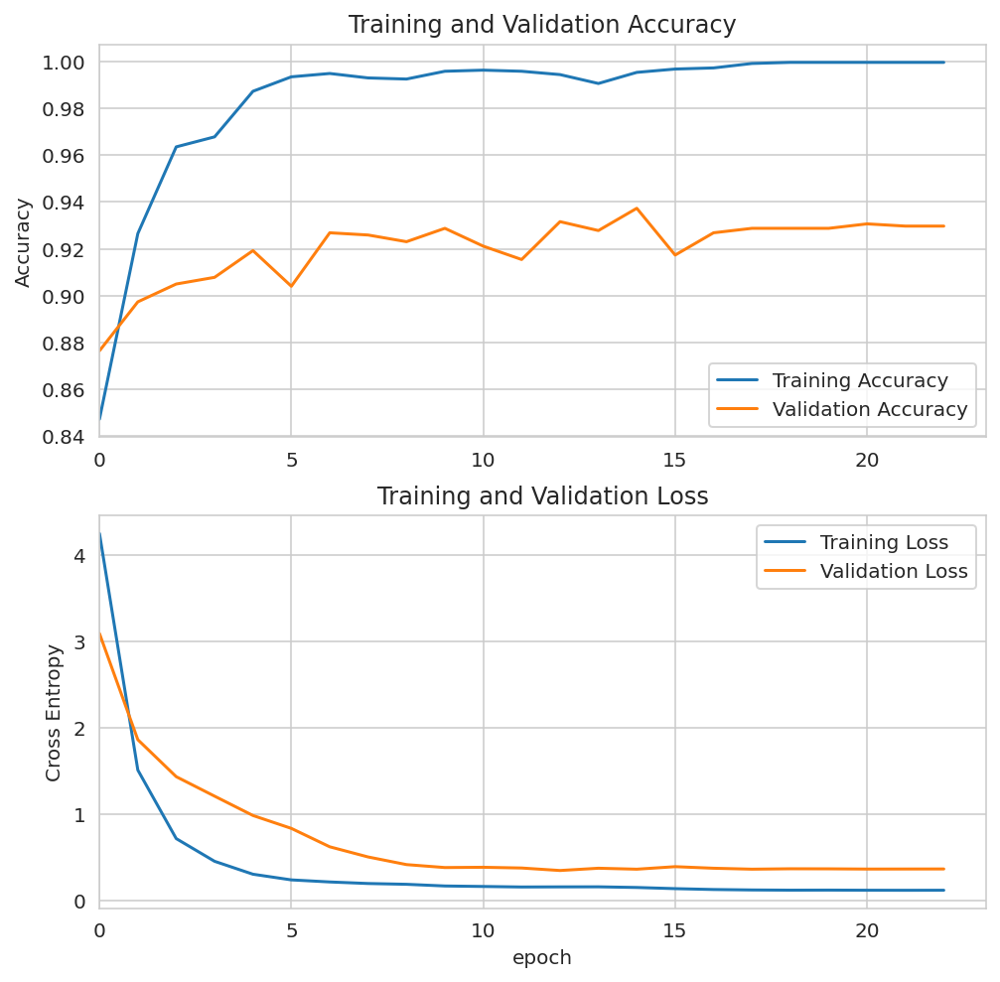

In [ ]:
learning_curves(acc,val_acc,loss,val_loss)

In [ ]:
# check for generalisation
def eval_metrics(epoch_num):
  val_auc = history.loc[history['epoch']==epoch_num, ['val_auc']].values[0][0]
  auc = history.loc[history['epoch']==epoch_num, ['auc']].values[0][0]
  auc_diff = (auc - val_auc)*100 / auc
  print('AUC percentage difference is:', abs(auc_diff), '%')

  val_acc = history.loc[history['epoch']==epoch_num, ['val_categorical_accuracy']].values[0][0]
  acc = history.loc[history['epoch']==epoch_num, ['categorical_accuracy']].values[0][0]
  acc_diff = (acc - val_acc)*100 / acc
  print()
  print('Accuracy percentage difference is:', abs(acc_diff), '%')

In [ ]:
eval_metrics(epoch_num=12) # record epoch 13 as 12

AUC percentage difference is: 1.3366556984494535 %

Accuracy percentage difference is: 6.31077389548196 %


Model at **epoch 13** may be regarded as best performing base InceptionResNetV2 model based on lowest validation loss, with accuracy generalisation within 7%.

InceptionResNetV2 model at **epoch 13** has the following validation metrics:

| Name                |   Scores   |
|:--------------------|:----------:|
|AUC                  |0.9862787724|
|Categorical Accuracy |0.931558907|
|F1 score             |0.9295666814|
|Loss                 |0.3473170996|
|Precision            |0.9337812066|
|Recall               |0.9249049425|


## InceptionResNetV2 model with augmentation layers

adding data augmentation layers, try running InceptionResNetV2 with data augmentation layers, and see if can get better performance, and maintain model generalisation.

In [ ]:
input_shape = (299, 299, 3)
base_model = tf.keras.applications.InceptionResNetV2(input_shape=input_shape,
                                                     include_top=False,
                                                     weights='imagenet',
                                                     pooling='max'
                                                     )
base_model.trainable=True # train entire model layers, yet with pre-trained weights from ImageNet

219070464/219055592 [==============================] - 1s 0us/step


In [ ]:
 # add rescaling layer to base model
 def InceptionResNet_a():
  inputs = tf.keras.Input(shape=(299, 299, 3))
  x = data_augmentation(inputs) # augmentation layer
  x = tf.keras.layers.Rescaling(1./255)(x) # rescaling layer
  x = base_model(x, training=True)
  x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
  x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
          bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
  x = Dropout(rate=.4, seed=123)(x)       
  output = Dense(4, activation='softmax')(x)
  # instantiate model with added layers
  model = Model(inputs=inputs, outputs=output)
  model.compile(tf.keras.optimizers.Adamax(learning_rate=0.001), 
                loss='categorical_crossentropy', 
                metrics=METRICS) 
  return model

model_a = InceptionResNet_a()

In [ ]:
model_a.summary()

## Compile, fit model, run

In [ ]:
# Train the model, doing validation at the end of each epoch.
epochs = 150 

callbacks = [
    tf.keras.callbacks.ModelCheckpoint("drive/MyDrive/Colab Notebooks/IRN-a_ep{epoch}_val{val_loss:.3f}", save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.001,restore_best_weights=True),
    tf.keras.callbacks.CSVLogger('drive/MyDrive/Colab Notebooks/IRN-a_history.csv'), # save history
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',factor=0.2,patience=3,verbose=1,mode='min',min_lr=0.00001)
]

history_a = model_a.fit(train_ds, epochs=epochs, validation_data=val_ds, callbacks=callbacks)

Epoch 1/150
66/66 [==============================] - 715s 10s/step - loss: 7.8143 - categorical_accuracy: 0.7234 - precision: 0.7709 - recall: 0.6689 - auc: 0.8960 - f1_score: 0.7133 - val_loss: 7.1507 - val_categorical_accuracy: 0.7576 - val_precision: 0.7916 - val_recall: 0.7148 - val_auc: 0.9123 - val_f1_score: 0.7504 - lr: 0.0010
Epoch 2/150
66/66 [==============================] - 710s 11s/step - loss: 6.3993 - categorical_accuracy: 0.8515 - precision: 0.8765 - recall: 0.8183 - auc: 0.9573 - f1_score: 0.8459 - val_loss: 5.8573 - val_categorical_accuracy: 0.8574 - val_precision: 0.8802 - val_recall: 0.8175 - val_auc: 0.9584 - val_f1_score: 0.8469 - lr: 0.0010
Epoch 3/150
66/66 [==============================] - 704s 11s/step - loss: 5.4432 - categorical_accuracy: 0.8928 - precision: 0.9091 - recall: 0.8733 - auc: 0.9779 - f1_score: 0.8905 - val_loss: 5.0794 - val_categorical_accuracy: 0.8888 - val_precision: 0.9123 - val_recall: 0.8698 - val_auc: 0.9733 - val_f1_score: 0.8900 - lr:

## Learning Curves 

In [ ]:
history = pd.read_csv('drive/MyDrive/Colab Notebooks/IRN-a_history.csv')
history.head(3)

,epoch,auc,categorical_accuracy,f1_score,loss,precision,recall,val_auc,val_categorical_accuracy,val_f1_score,val_loss,val_precision,val_recall
0,0,0.896004,0.723435,0.713287,7.814284,0.770913,0.668880,0.912271,0.757605,0.750392,7.150661,0.791579,0.714829
1,1,0.957306,0.851518,0.845872,6.399283,0.876524,0.818311,0.958436,0.857414,0.846941,5.857329,0.880246,0.817491
2,2,0.977876,0.892789,0.890486,5.443238,0.909136,0.873340,0.973312,0.888783,0.890033,5.079364,0.912263,0.869772


In [ ]:
acc = history['categorical_accuracy']
val_acc = history['val_categorical_accuracy']

loss = history['loss']
val_loss = history['val_loss']

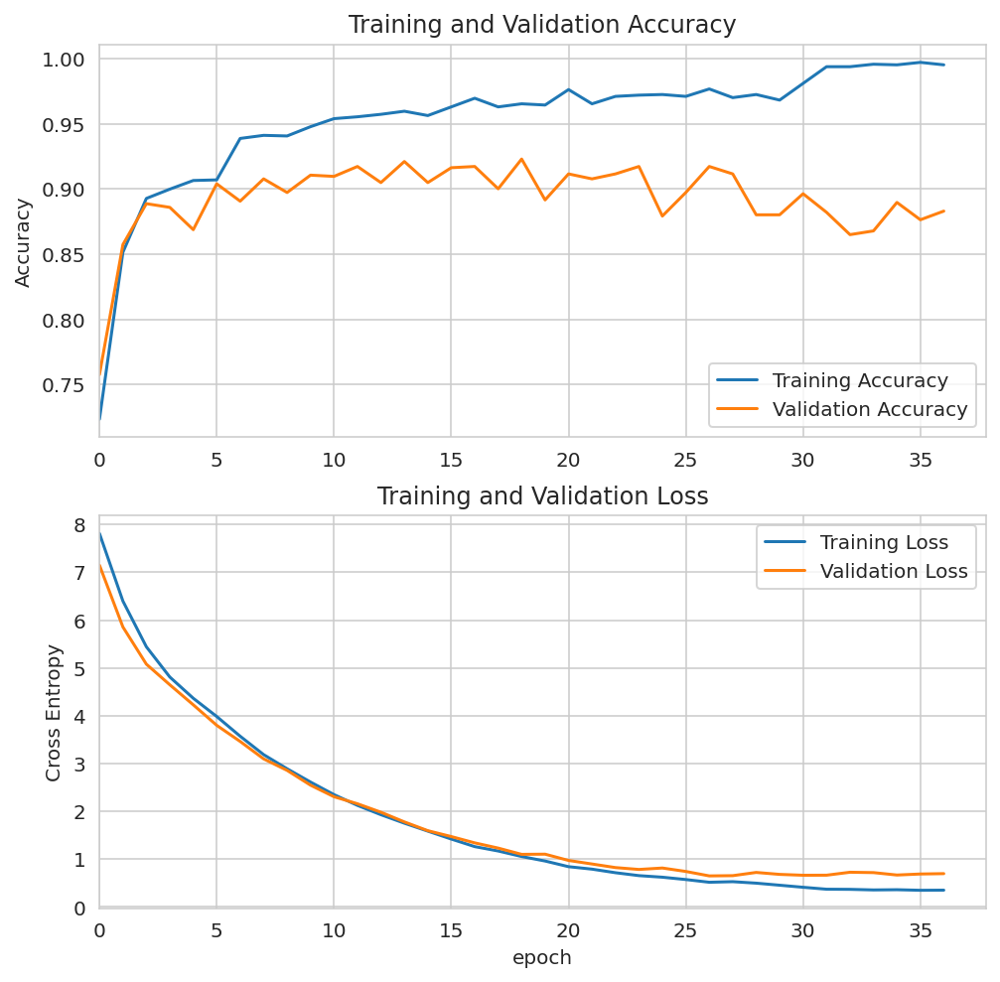

In [ ]:
learning_curves(acc,val_acc,loss,val_loss)

In [ ]:
# check for generalisation using epoch 27
eval_metrics(epoch_num=26)

AUC percentage difference is: 1.2790758615864888 %

Accuracy percentage difference is: 6.086970265205847 %


After adding data augmentation layers, the InceptionResNetV2 model is **unable** to train to a lower validation loss compared to the base model. Generalisation is less than 7%

Validation metrics of the best augmented InceptionResNetV2 model @ **epoch 27** are as follow:

| Name                |   Scores   |
|:--------------------|:----------:|
|AUC                  |0.9857632518|
|Categorical Accuracy |0.9173004031|
|F1 score             |0.9189367294|
|Loss                 |0.650366962|
|Precision            |0.9298928976|
|Recall               |0.9077946544|

## Evaluation

Using test dataset and base model.

__References:__
1. [images](https://machinelearningmastery.com/image-augmentation-with-keras-preprocessing-layers-and-tf-image/)
1. [kaggle code](https://www.kaggle.com/code/gpiosenka/eye-disease-f1-score-92-6/notebook)

In [ ]:
# choose model for evaluation
# load model
model = tf.keras.models.load_model("drive/MyDrive/Colab Notebooks/IRN_ep13_val0.347", 
                                   custom_objects={'f1_score': f1_score})

### Plot confusion matrix for train, validation and test sets

[Multiclass confusion matrix](https://www.analyticsvidhya.com/blog/2021/06/confusion-matrix-for-multi-class-classification/#:~:text=Confusion%20Matrix%20is%20used%20to,number%20of%20classes%20or%20outputs.)


In [ ]:
# get predictions for confusion matrix
# class_names = train_ds.class_names # from previous cell
print(class_names)

print('===== test_ds predictions =====')
test_preds = model.predict(test_ds, verbose=1) # get test_ds predictions
# sample test_ds predictions
print(test_preds[:1])
for array in test_preds:
  print(f'{class_names[0]} probability is: {array[0]:.4f}')
  print(f'{class_names[1]} probability is: {array[1]:.4f}')
  print(f'{class_names[2]} probability is: {array[2]:.4f}')
  print(f'{class_names[3]} probability is: {array[3]:.4f}')
  break

print() #gap

print('===== train_ds predictions =====')
train_preds = model.predict(train_ds, verbose=1) # get train_ds predictions
# sample train_ds predictions
print(train_preds[:1])
for array in train_preds:
  print(f'{class_names[0]} probability is: {array[0]:.4f}')
  print(f'{class_names[1]} probability is: {array[1]:.4f}')
  print(f'{class_names[2]} probability is: {array[2]:.4f}')
  print(f'{class_names[3]} probability is: {array[3]:.4f}')
  break

print() #gap

print('===== val_ds predictions =====')
val_preds = model.predict(val_ds, verbose=1) # get val_ds predictions
# sample val_ds predictions
print(val_preds[:1])
for array in val_preds:
  print(f'{class_names[0]} probability is: {array[0]:.4f}')
  print(f'{class_names[1]} probability is: {array[1]:.4f}')
  print(f'{class_names[2]} probability is: {array[2]:.4f}')
  print(f'{class_names[3]} probability is: {array[3]:.4f}')
  break

['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']
===== test_ds predictions =====
34/34 [==============================] - 43s 1s/step
[[0.9769493  0.00515551 0.01024278 0.0076524 ]]
cataract probability is: 0.9769
diabetic_retinopathy probability is: 0.0052
glaucoma probability is: 0.0102
normal probability is: 0.0077

===== train_ds predictions =====
66/66 [==============================] - 88s 1s/step
[[0.979864   0.00458458 0.00900766 0.00654373]]
cataract probability is: 0.9799
diabetic_retinopathy probability is: 0.0046
glaucoma probability is: 0.0090
normal probability is: 0.0065

===== val_ds predictions =====
33/33 [==============================] - 42s 1s/step
[[0.9735615  0.00625125 0.01161234 0.00857488]]
cataract probability is: 0.9736
diabetic_retinopathy probability is: 0.0063
glaucoma probability is: 0.0116
normal probability is: 0.0086


In [ ]:
y_pred_probs = np.max(test_preds, axis=-1) # store probabilities of predictions for later use

In [ ]:
# convert probabilities into ohe
# for confusion matrix

# for test_ds
idx = np.argmax(test_preds, axis=-1)
test_preds = np.zeros( test_preds.shape ) 
test_preds[ np.arange(test_preds.shape[0]), idx] = 1  

#print(train_preds.argmax(axis=1))
#print(train_labels.argmax(axis=1))

# for train_ds
idx = np.argmax(train_preds, axis=-1)
train_preds = np.zeros( train_preds.shape ) 
train_preds[ np.arange(train_preds.shape[0]), idx] = 1  

# for val_ds
idx = np.argmax(val_preds, axis=-1)
val_preds = np.zeros( val_preds.shape ) 
val_preds[ np.arange(val_preds.shape[0]), idx] = 1  

print('Predicted test_ds labels:', test_preds[:5])
print() # gap
print('Predicted train_ds labels:', train_preds[:5])
print() # gap
print('Predicted val_ds labels:', val_preds[:5])

Predicted test_ds labels: [[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]

Predicted train_ds labels: [[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]

Predicted val_ds labels: [[1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]


In [ ]:
# extract true labels and images from test_ds
test_labels = np.concatenate([y for x, y in test_ds], axis=0)
test_images = np.concatenate([x for x, y in test_ds], axis=0)

# extract true labels and images from train_ds
train_labels = np.concatenate([y for x, y in train_ds], axis=0)
train_images = np.concatenate([x for x, y in train_ds], axis=0)

# extract true labels and images from val_ds
val_labels = np.concatenate([y for x, y in val_ds], axis=0)
val_images = np.concatenate([x for x, y in val_ds], axis=0)

print('===== Test set true labels =====') 
print(test_labels[:5])
print() # gap
print('===== Train set true labels =====')
print(train_labels[:5])
print() # gap
print('===== Validation set true labels =====')
print(val_labels[:5])

===== Test set true labels =====
[[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]

===== Train set true labels =====
[[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]

===== Validation set true labels =====
[[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]


In [ ]:
from sklearn.metrics import confusion_matrix
# Creating a confusion matrix for test_ds predictions
test_cm = confusion_matrix(test_labels.argmax(axis=1), test_preds.argmax(axis=1))
# Creating a confusion matrix for train_ds predictions
train_cm = confusion_matrix(train_labels.argmax(axis=1), train_preds.argmax(axis=1))
# Creating a confusion matrix for val_ds predictions
val_cm = confusion_matrix(val_labels.argmax(axis=1), val_preds.argmax(axis=1))

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
test_cm_df = pd.DataFrame(test_cm,
                          index = class_names, 
                          columns = class_names)
train_cm_df = pd.DataFrame(train_cm,
                           index = class_names, 
                           columns = class_names)
val_cm_df = pd.DataFrame(val_cm,
                         index = class_names, 
                         columns = class_names)

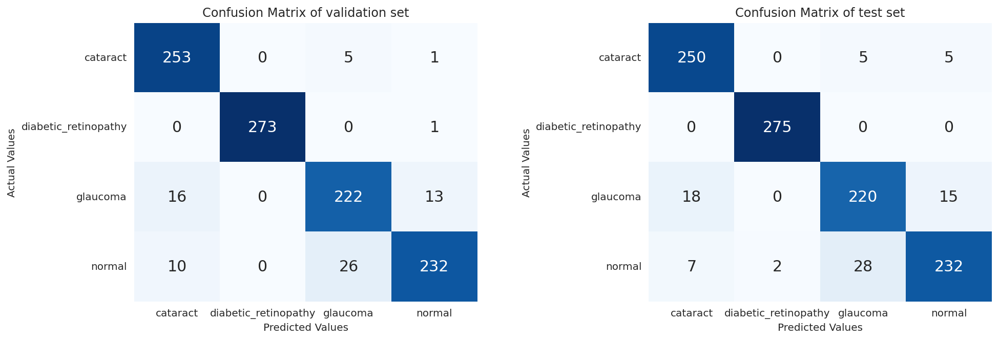

In [ ]:
#Plotting confusion matrix using heatmap
fig, axes = plt.subplots(1, 2, figsize=(15,5))
#sns.heatmap(train_cm_df, annot=True, cbar=False, cmap='Blues', vmin=0, fmt='.3g', annot_kws={"size": 15}, ax=axes[0])
#axes[0].set_title('Confusion Matrix of train set')
#axes[0].set_ylabel('Actual Values')
#axes[0].set_xlabel('Predicted Values')

sns.heatmap(val_cm_df, annot=True, cbar=False, cmap='Blues', vmin=0, fmt='.3g', annot_kws={"size": 15}, ax=axes[0])
axes[0].set_title('Confusion Matrix of validation set')
axes[0].set_ylabel('Actual Values')
axes[0].set_xlabel('Predicted Values')

sns.heatmap(test_cm_df, annot=True, cbar=False, cmap='Blues', vmin=0, fmt='.3g', annot_kws={"size": 15}, ax=axes[1])
axes[1].set_title('Confusion Matrix of test set')
axes[1].set_ylabel('Actual Values')
axes[1].set_xlabel('Predicted Values')

plt.subplots_adjust(wspace=0.5)

plt.show()

### Classification report

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(test_labels, test_preds, target_names=class_names, digits= 4))

                      precision    recall  f1-score   support

            cataract     0.9091    0.9615    0.9346       260
diabetic_retinopathy     0.9928    1.0000    0.9964       275
            glaucoma     0.8696    0.8696    0.8696       253
              normal     0.9206    0.8625    0.8906       269

           micro avg     0.9243    0.9243    0.9243      1057
           macro avg     0.9230    0.9234    0.9228      1057
        weighted avg     0.9243    0.9243    0.9239      1057
         samples avg     0.9243    0.9243    0.9243      1057



Model is not great at identifying glaucoma from cataract or normal images. This makes sense since these images can look very similar to retinal images with glaucoma. The model is best at identifying diabetic retinopathy.

## Misclassified test images

In [ ]:
# extract test file names from test_ds 
test_filenames = test_ds.file_paths

In [ ]:
len(test_filenames)

1057

In [ ]:
class_names

['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

In [ ]:
# convert OHE to class_names for easier comparison 
y_true = tf.argmax(test_labels, axis=1).numpy() # tensor object not iterable, use numpy to convert to list
y_pred = tf.argmax(test_preds, axis=1).numpy()
print('First 5 true labels:', y_true[:5])
print('First 5 predictions:', y_pred[:5])

error_list = []

for a, b, c, d in zip(y_true, y_pred, y_pred_probs, test_filenames):
  if a != b:
    error_list.append((class_names[a],class_names[b],c,d))

First 5 true labels: [0 0 0 0 0]
First 5 predictions: [0 0 2 0 0]


In [ ]:
len(error_list)

80

In [ ]:
print('Prediction accuracy on test data:', 100 - (len(error_list)*100/len(test_filenames)), '%')

Prediction accuracy on test data: 92.4314096499527 %


### Looking into specific images that were misclassified

In [ ]:
error_list[:5] # check formatting

[('cataract',
  'glaucoma',
  0.45664322,
  './work_directory/test/cataract/1102_left.jpg'),
 ('cataract',
  'normal',
  0.5871938,
  './work_directory/test/cataract/119_left.jpg'),
 ('cataract',
  'glaucoma',
  0.452106,
  './work_directory/test/cataract/1415_right.jpg'),
 ('cataract',
  'glaucoma',
  0.57675886,
  './work_directory/test/cataract/1456_left.jpg'),
 ('cataract',
  'normal',
  0.8965301,
  './work_directory/test/cataract/1968_left.jpg')]

[Kaggle reference notebook](https://www.kaggle.com/code/gpiosenka/eye-disease-f1-score-92-6/notebook#Create-a-model-using-transfer-learning-with-EfficientNetB3)

In [ ]:
def print_in_color(txt_msg,fore_tupple=(0,255,255),back_tupple=(100,100,100)):
    #prints the text_msg in the foreground color specified by fore_tupple with the background specified by back_tupple 
    #text_msg is the text, fore_tupple is foregroud color tupple (r,g,b), back_tupple is background tupple (r,g,b)
    # default parameter print in cyan foreground and gray background
    rf,gf,bf=fore_tupple
    rb,gb,bb=back_tupple
    msg='{0}' + txt_msg
    mat='\33[38;2;' + str(rf) +';' + str(gf) + ';' + str(bf) + ';48;2;' + str(rb) + ';' +str(gb) + ';' + str(bb) +'m' 
    print(msg .format(mat), flush=True)
    print('\33[0m', flush=True) # returns default print color to back to black
    return

# example default print
msg='test of default colors'
print_in_color(msg)

test of default colors



In [ ]:
import re

print ('Below is a list of test files that were misclassified \n')
msg='{0:^10}{1:^30s}{2:^20s}{3:^20s}{4:^15s}'.format('No.','Test File','True Label','Predicted as','Probability')
print_in_color(msg)

for i, (a, b, c, d) in enumerate(error_list):
  x = re.split('./work_directory/test/', d)[-1]
  print('{0:^10}{1:^30s}{2:^20s}{3:^20s}  {4:.4f}'.format(i+1,x,a,b,c))

Below is a list of test files that were misclassified 

   No.              Test File                True Label         Predicted as      Probability  

    1         cataract/1102_left.jpg          cataract            glaucoma        0.4566
    2         cataract/119_left.jpg           cataract             normal         0.5872
    3        cataract/1415_right.jpg          cataract            glaucoma        0.4521
    4         cataract/1456_left.jpg          cataract            glaucoma        0.5768
    5         cataract/1968_left.jpg          cataract             normal         0.8965
    6         cataract/1987_left.jpg          cataract             normal         0.7634
    7        cataract/2140_right.jpg          cataract             normal         0.9665
    8         cataract/81_right.jpg           cataract             normal         0.9680
    9       cataract/_334_6427863.jpg         cataract            glaucoma        0.7199
    10       cataract/_57_3959793.jpg         

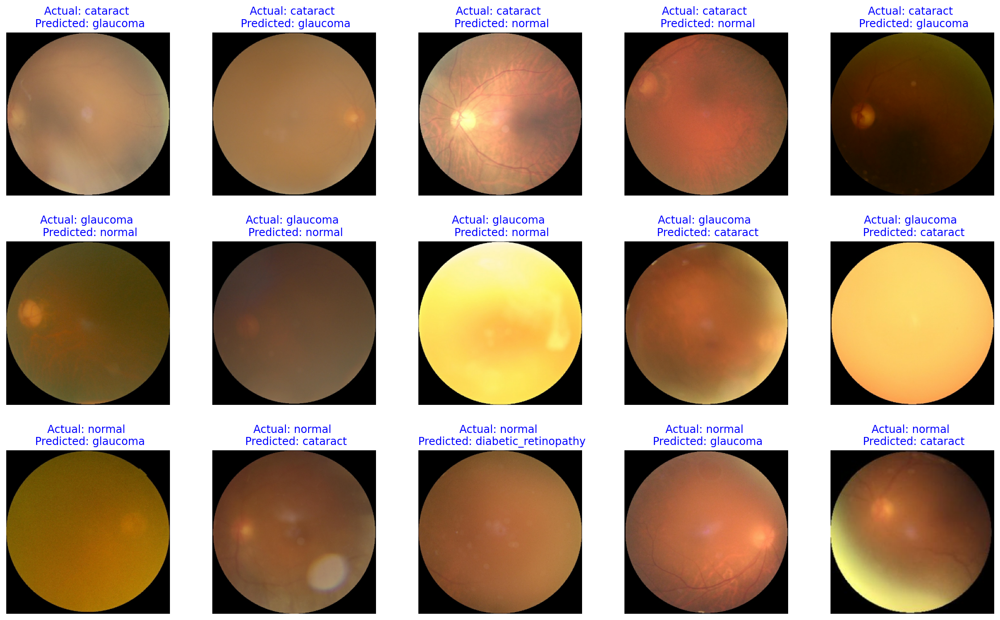

In [ ]:
# to display examples of each class that were wrongly classified
fig, axes = plt.subplots(3, 5, figsize=(20, 12)) # 3 rows, 5 cols

def axes_img(r,c,i):
  axes[r,c].imshow(test_images[i].astype('uint8'))
  axes[r,c].axis('off')
  axes[r,c].set_title(f'Actual: {error_list[i][0]} \n Predicted: {error_list[i][1]}', color='blue')

axes_img(r=0,c=0,i=0)  # first row - actual cataract
axes_img(r=0,c=1,i=3)
axes_img(r=0,c=2,i=5)
axes_img(r=0,c=3,i=7)
axes_img(r=0,c=4,i=9)

axes_img(r=1,c=0,i=10) # 2nd row - actual glaucoma 
axes_img(r=1,c=1,i=19)
axes_img(r=1,c=2,i=25)
axes_img(r=1,c=3,i=34)
axes_img(r=1,c=4,i=40)

axes_img(r=2,c=0,i=47) # 3rd row - actual normal
axes_img(r=2,c=1,i=51) 
axes_img(r=2,c=2,i=64)
axes_img(r=2,c=3,i=72)
axes_img(r=2,c=4,i=79)

plt.subplots_adjust(hspace=0.28) # add space between rows
plt.show()

Misclassified cataract images were either wrongly classified as normal or glaucoma. Reason is unclear.

Misclassified glaucoma images were either wrongly classified as normal or cataract. Reason is unclear.

Misclassified normal images appear poor quality, which makes sense that model confuse these images with other classes.

## Saliency maps

[Reference](https://www.analyticsvidhya.com/blog/2022/06/introduction-to-saliency-map-in-an-image-with-tensorflow-2-x-api/)

In [ ]:
# useful functions
def input_img(path): #read source image file
    image = tf.image.decode_png(tf.io.read_file(path))
    image = tf.expand_dims(image, axis=0)
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, [299,299])
    return image
def normalize_image(img): #normalise image
    grads_norm = img[:,:,0]+ img[:,:,1]+ img[:,:,2]
    grads_norm = (grads_norm - tf.reduce_min(grads_norm))/ (tf.reduce_max(grads_norm)- tf.reduce_min(grads_norm))
    return grads_norm
# see this for cmap options: https://matplotlib.org/stable/tutorials/colors/colormaps.html
def plot_maps(img1, img2,vmin=0.3,vmax=0.7, mix_val=2): 
    f = plt.figure(figsize=(15,45))
    plt.subplot(1,3,1)
    plt.imshow(img1,vmin=vmin, vmax=vmax, cmap="terrain")
    plt.title('Saliency map')
    plt.axis("off")
    plt.subplot(1,3,2)
    plt.imshow(img2, cmap = "terrain")
    plt.title('Input image')
    plt.axis("off")
    plt.subplot(1,3,3)
    plt.imshow(img1*mix_val+img2/mix_val, cmap = "terrain" )
    plt.title('Overlayed image')
    plt.axis("off")
def plot_orig_img(filepath):
    img_path = filepath
    input_im = input_img(img_path)
    input_im = tf.keras.applications.inception_resnet_v2.preprocess_input(input_im)
    plt.imshow(normalize_image(input_im[0]))
    plt.axis('off');
    return input_im
def plot_gradient_maps(input_im): # plot_maps() function embedded
    with tf.GradientTape() as tape:
        tape.watch(input_im)
        result_img = model(input_im)
        max_idx = tf.argmax(result_img,axis = 1)
        max_score = result_img[0,max_idx[0]]
    grads = tape.gradient(max_score, input_im)
    plot_maps(normalize_image(grads[0]), normalize_image(input_im[0]))

How model interprets retina image with Glaucoma:

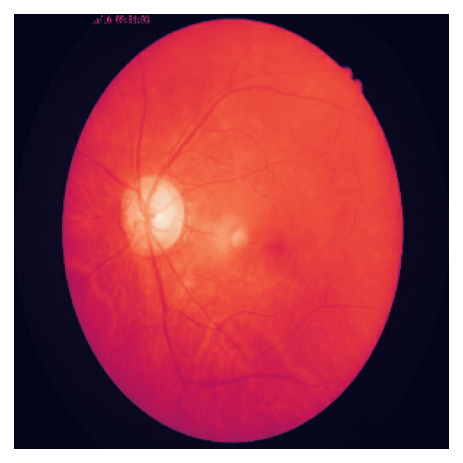

In [ ]:
# using 1 example to demonstrate
input_im = plot_orig_img(filepath="./dataset/glaucoma/1495_left.jpg");

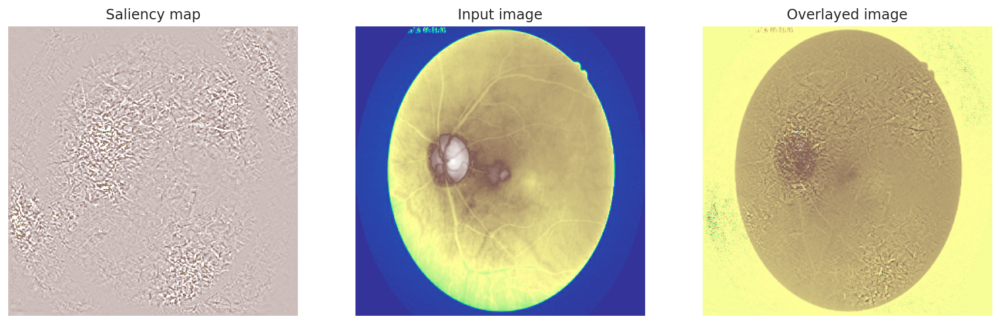

In [ ]:
plot_gradient_maps(input_im)

How model interprets retinal image with diabetic retinopathy:

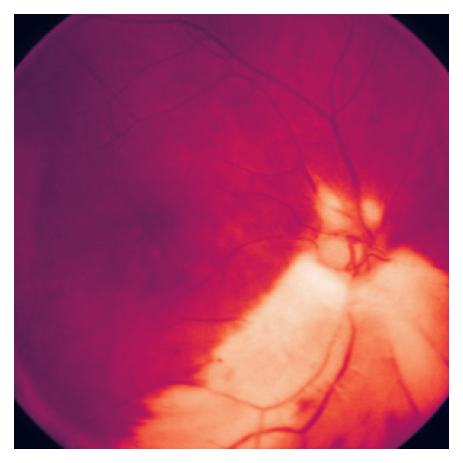

In [ ]:
# using 1 example to demonstrate
input_im = plot_orig_img(filepath="./dataset/diabetic_retinopathy/1145_left.jpeg");

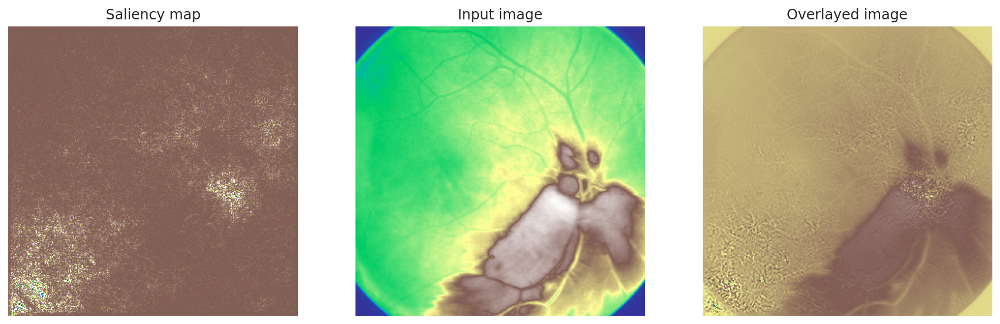

In [ ]:
plot_gradient_maps(input_im)

How model interprets retinal image with cataract:

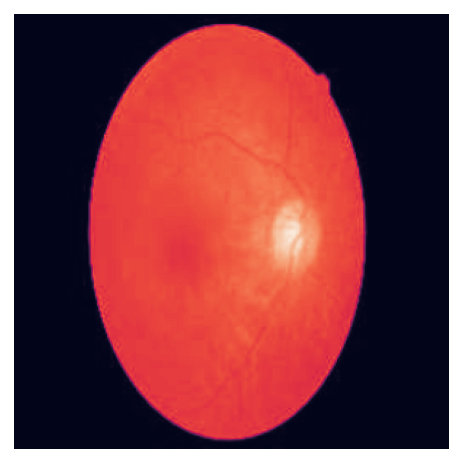

In [ ]:
# using 1 example to demonstrate
input_im = plot_orig_img(filepath="./dataset/cataract/_331_2978484.jpg");

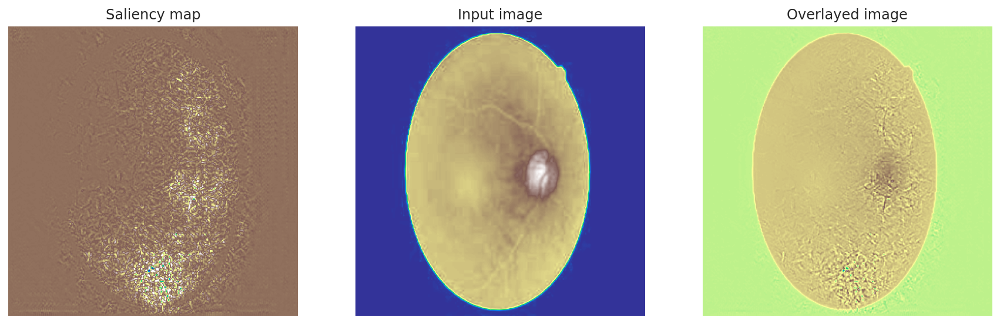

In [ ]:
plot_gradient_maps(input_im)

How model interprets a normal retinal image:

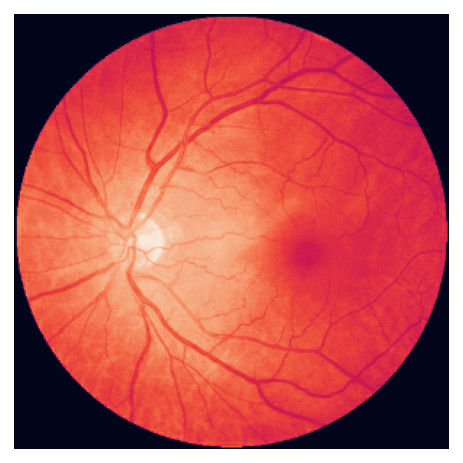

In [ ]:
# using 1 example to demonstrate
input_im = plot_orig_img(filepath="./dataset/normal/2627_left.jpg");

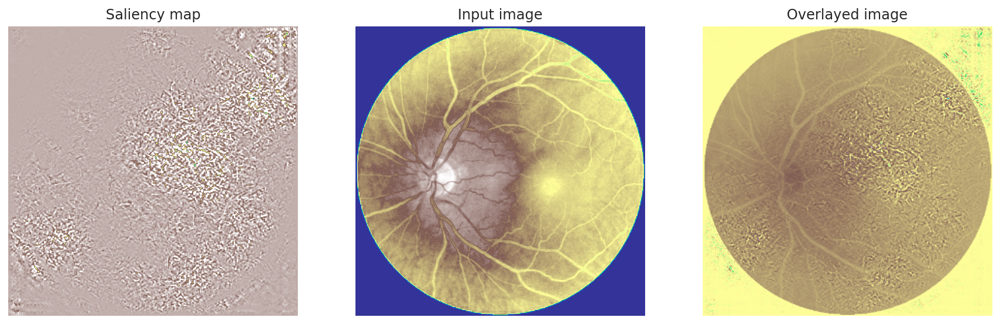

In [ ]:
plot_gradient_maps(input_im)

The saliency maps show that the model is easily confused by the black background, giving the background importance when it should be identifying abnormalities in the retina. Out of the classes, only cataract image is being correctly scoped out by the model in terms of the area of image to focus on.

## Activation Heatmaps

[Reference](https://medium.com/analytics-vidhya/visualizing-activation-heatmaps-using-tensorflow-5bdba018f759)

In [ ]:
import cv2
from google.colab.patches import cv2_imshow # cv2.imshow does not work on Google Colab notebooks, which is why we are using cv2_imshow instead

In [ ]:
model.summary() # to get final convolutional layer name

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_203 (Conv2D)            (None, 149, 149, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_203 (Batch  (None, 149, 149, 32  96         ['conv2d_203[0][0]']             
 Normalization)                 )                                                             

How to insert text to OpenCV images:

__References:__
1. [StackOverFlow](https://stackoverflow.com/questions/42420470/opencv-subplots-images-with-titles-and-space-around-borders)
1. [OpenCV answers](https://answers.opencv.org/question/175912/how-to-display-multiple-images-in-one-window/)

In [ ]:
def gradCAM(orig, intensity=0.5, res=250): # function

  img = tf.keras.preprocessing.image.load_img(orig, target_size=(299, 299))

  x = tf.keras.preprocessing.image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = tf.keras.applications.efficientnet_v2.preprocess_input(x) # shape (1,160,160,3)

  with tf.GradientTape() as tape: # Grad-CAM process
    last_conv_layer = model.get_layer('conv_7b')
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output]) # create mini model function to get model output
    model_out, last_conv_layer = iterate(x) # model_out shape (1,4)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    
  heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)
  heatmap = np.maximum(heatmap, 0) 
  heatmap /= np.max(heatmap) # minmax pixel values (0,1)
  heatmap = heatmap.reshape((8, 8)) # reshape to 8x8 array

  img = cv2.imread(orig)

  heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

  heatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET) # multiply 255 to convert to RGB form

  img = heatmap * intensity + img
  
  img1 = cv2.resize(cv2.imread(orig), (res, res)) # visualise original image
  img2 = cv2.resize(img, (res, res)) # visualise heatmap overlay
  combined_img = np.concatenate((img1,img2), axis=1)
  # put grey headings
  grey= np.zeros((30, combined_img.shape[1], 3), np.uint8)
  grey[:] = (169, 169, 169) 
  # join grey heading with combined_img
  vcat = np.concatenate((grey, combined_img), axis=0)
  # insert text
  font = cv2.FONT_HERSHEY_DUPLEX
  cv2.putText(vcat, 'Original image + Activation heatmap', (20,20), font, 0.7,(0,0,0), 1, 0)
  cv2_imshow(vcat)

For normal image:

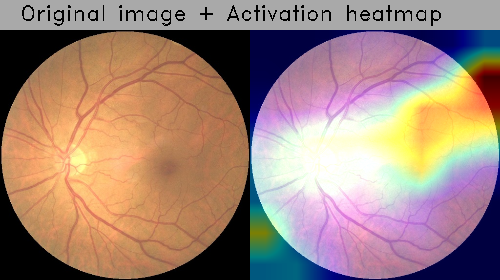

In [ ]:
gradCAM(orig='./dataset/normal/2627_left.jpg')

For glaucoma image:

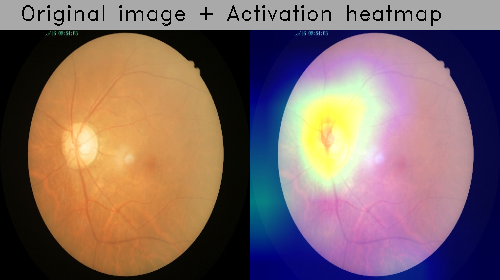

In [ ]:
gradCAM(orig="./dataset/glaucoma/1495_left.jpg")

For cataract image:

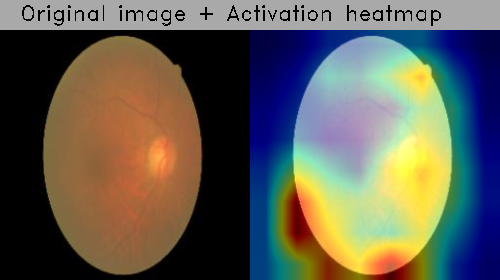

In [ ]:
gradCAM(orig="./dataset/cataract/_331_2978484.jpg")

For diabetic retinopathy image:

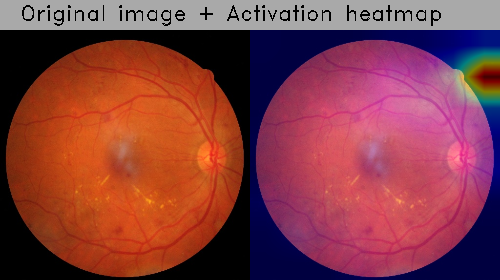

In [ ]:
gradCAM(orig="./dataset/diabetic_retinopathy/1008_right.jpeg")

Generally, this model is **not** being activated by the important features in the retinal images. Only for the glaucoma class, the model is activated correctly by the optic disc region. This would make it difficult to convince stakeholders e.g. doctors to trust the model in accurately helping with initial screening of retinal images since the model is not actually being activated by features that doctors would consider important for diagnosis. 